# Projet d'outil de programmation à L'IA : Spam Detector
Data available at this link : https://huggingface.co/datasets/Deysi/spam-detection-dataset

Student : Thibaut LONGCHAMPS

course taught by: Medhi AMMI

## Project Aim:

The objective of this project is to carry out the necessary preprocessing to develop differents deep learning models (unified and multimodal) capable of classifying messages into two categories: Spam or not spam (binary classification). The models' performances will be compared, and hyperparameter optimization will be conducted on the best-performing model.

Label:
- spam : 1
- not_spam : 0

In [ ]:
# Import usual librairies
import pandas as pd
import os
import random
import numpy as np
import tensorflow as tf

# Define seed
seed = 99

random.seed(seed)
np.random.seed(seed)
tf.random.set_seed(seed)

import warnings
# Suppress all warnings
warnings.filterwarnings('ignore')

## Load raw data

In [2]:
# Load data from Huggin Face data base
from datasets import load_dataset
ds = load_dataset("Deysi/spam-detection-dataset")

In [3]:
# Access to dictionnary keys
print(ds.keys())

dict_keys(['train', 'test'])


In [4]:
# Convert each dictionnay to DataFrames
train_ds = ds['train'].to_pandas()
test_ds = ds['test'].to_pandas()

# Merged Dataframes 
df_spam = pd.concat([train_ds, test_ds], ignore_index=True)

In [5]:
# Define base project path
base_path = r"c:\Users\33760\Desktop\Projet-IA-M2"

# Check if base path exist and define it as work directory
if os.path.exists(base_path):
    os.chdir(base_path)
    print("Work directorty path :", os.getcwd())
else:
    print("The base path specify doesn't exist :", base_path)

Work directorty path : c:\Users\33760\Desktop\Projet-IA-M2


In [6]:
# Define data path
data_path = os.path.join(base_path, "data\emails.csv")
print(f"File path :{data_path}\n")

# Check if data path exist
if os.path.exists(data_path):
    print(f"File path found !")
else:
    print(f"File path not found: {data_path}")

File path :c:\Users\33760\Desktop\Projet-IA-M2\data\emails.csv

File path found !


In [7]:
# Convert merged data to CSV data path
df_spam.to_csv(data_path, index = False)

In [ ]:
# Load and read data
df_spam = pd.read_csv(data_path)
# Create a copy 
df_spam_copy = df_spam.copy()
# Display DataFrames
df_spam.head()

,text,label
0,hey I am looking for Xray baggage datasets can...,not_spam
1,"""Get rich quick! Make millions in just days wi...",spam
2,URGENT MESSAGE: YOU WON'T BELIEVE WHAT WE HAVE...,spam
3,[Google AI Blog: Contributing Data to Deepfake...,not_spam
4,Trying to see if anyone already has timestamps...,not_spam


## Discover data

In [9]:
# Display some informations about data
df_spam.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10900 entries, 0 to 10899
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   text    10900 non-null  object
 1   label   10900 non-null  object
dtypes: object(2)
memory usage: 170.4+ KB


In [10]:
# Display data type
df_spam.dtypes

text     object
label    object
dtype: object

In [11]:
# Display label name
print(df_spam['label'].dtype)
print(df_spam['label'].unique())

object
['not_spam' 'spam']


In [12]:
# Display data Shape
df_spam.shape

(10900, 2)

In [13]:
# Label distribution
df_spam['label'].value_counts()

label
spam        5500
not_spam    5400
Name: count, dtype: int64

The dataset has balanced labels: Data augmentation using synonym replacement techniques... will not be necessary.

In [14]:
# NaN values
df_spam.isnull().sum()

text     0
label    0
dtype: int64

The dataset does not contain any missing data.

In [15]:
# Display DataFrames 
df_spam.head(15)

,text,label
0,hey I am looking for Xray baggage datasets can...,not_spam
1,"""Get rich quick! Make millions in just days wi...",spam
2,URGENT MESSAGE: YOU WON'T BELIEVE WHAT WE HAVE...,spam
3,[Google AI Blog: Contributing Data to Deepfake...,not_spam
4,Trying to see if anyone already has timestamps...,not_spam
5,Bridging the gap between artificial intelligen...,not_spam
6,hi all any good leads on datasets for fuel pri...,not_spam
7,"\n\nHi everyone,\n\nFor my thesis I'm looking...",not_spam
8,I'm looking for a large dataset of n-grams (pr...,not_spam
9,Check out these amazing weight loss pills! The...,spam


First observations before data preprocessing :

- Handle type casting
- Handle special characters
- Handle emojis
- Handle punctuation
- Handle potential links

## EDA : Explanatory Data Analysis

In [16]:
from plotly.subplots import make_subplots
import plotly.express as px

# Create Pie chart
fig_pie = px.pie(df_spam, names="label")

# Create histogram
fig_hist = px.histogram(df_spam, x="label", color="label")

# Create a combined figure with two graph
fig = make_subplots(
    rows=1, cols=2, 
    specs=[[{"type": "domain"}, {"type": "xy"}]],  # Specify graph type
    subplot_titles=("Relative Distribution Label (Pie Chart)", "Absolute Distribution Label (Histogram)")
)

# Add Pie chart
fig.add_trace(fig_pie.data[0], row=1, col=1)

# Add Histogram
for trace in fig_hist.data:
    trace.showlegend = False  # Desactivate legend for histogram 
    fig.add_trace(trace, row=1, col=2)

# Define settings figure
fig.update_layout(
    title_text="Combined View of Target 'label' Distribution",
    width=1000,
    height=500
)

# Display graph
fig.show()


As mentionned before the target is balanced.

In order to perform a detail EDA use a NLP library ease analysis. I'am used to using NLTK !

In [17]:
# Define a nltk data path in order to use NLP nltk library
print(f'base path : {base_path}')

nltk_data_path = os.path.join(base_path, 'nltk_data')
print(f'nltk data path : {nltk_data_path}')

base path : c:\Users\33760\Desktop\Projet-IA-M2
nltk data path : c:\Users\33760\Desktop\Projet-IA-M2\nltk_data


In [18]:
# Import the NLTK library for NLP
import nltk

# Dowload the 'punkt_tab' ressource and specify the custom directory (nltk_data_path)
nltk.download('punkt_tab', download_dir=nltk_data_path)

# Add created path (nltk_data_path) to NLTK library configuration in order to nlpk worked
nltk.data.path.append(nltk_data_path)

# Override the default NLTK paths with custom directory 
nltk.data.path = [nltk_data_path]

[nltk_data] Downloading package punkt_tab to
[nltk_data]     c:\Users\33760\Desktop\Projet-IA-M2\nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!


In [19]:
from nltk.tokenize import word_tokenize

# Calculate characters number for each text
df_spam["caracter_nb"] = df_spam["text"].apply(len)

# Tokenize each message into words and calculate the number of words
df_spam["word_nb"] = df_spam.apply(lambda row: nltk.word_tokenize(row["text"]), axis=1).apply(len)

# Tokenize each message into sentences and calculate the number of sentences
df_spam["sentence_nb"] = df_spam.apply(lambda row: nltk.sent_tokenize(row["text"]), axis=1).apply(len)

In [20]:
df_spam.head()

,text,label,caracter_nb,word_nb,sentence_nb
0,hey I am looking for Xray baggage datasets can...,not_spam,76,15,1
1,"""Get rich quick! Make millions in just days wi...",spam,129,27,3
2,URGENT MESSAGE: YOU WON'T BELIEVE WHAT WE HAVE...,spam,495,122,11
3,[Google AI Blog: Contributing Data to Deepfake...,not_spam,1057,160,3
4,Trying to see if anyone already has timestamps...,not_spam,223,47,3


Thanks to this NLP preprocessing we can generate some statistics to better understand data.

In [21]:
# Display distribution and range
stats = df_spam.describe().T.style.background_gradient()
stats

,count,mean,std,min,25%,50%,75%,max
caracter_nb,10900.000000,372.916422,590.466161,1.000000,174.000000,285.000000,507.000000,41544.000000
word_nb,10900.000000,75.624679,113.318933,1.000000,36.000000,58.000000,106.000000,8322.000000
sentence_nb,10900.000000,4.767982,3.238908,1.000000,3.000000,4.000000,6.000000,65.000000


The generated table will display summary statistics for each column in the DataFrame. The color gradient applied to the table visually represents the magnitude of the values. This allows for a rapid visual comprehension of the distribution and range of the variables within the DataFrame.

relevants observations :

- huge gap between mean and standard deviation (caracter and word) ==> This difference between the mean and the median suggests a positive skewness (or right skewness) in the distribution of these variables, indicating that some observations have exceptionally high values that pull the mean upwards.


- This observation is confirmed by the max column. These significant differences between the maximum values and the upper quartiles indicate the presence of one or more outliers or extremes in the data.
- The quartiles show that 50% of the observations have :
Less than 285 characters.
Less than 58 words.
Less than 4 sentences.
This shows that the majority of observations are relatively short.

These extreme values should therefore be removed in order to reduce the bias and enable the model to generalise its predictions more effectively.

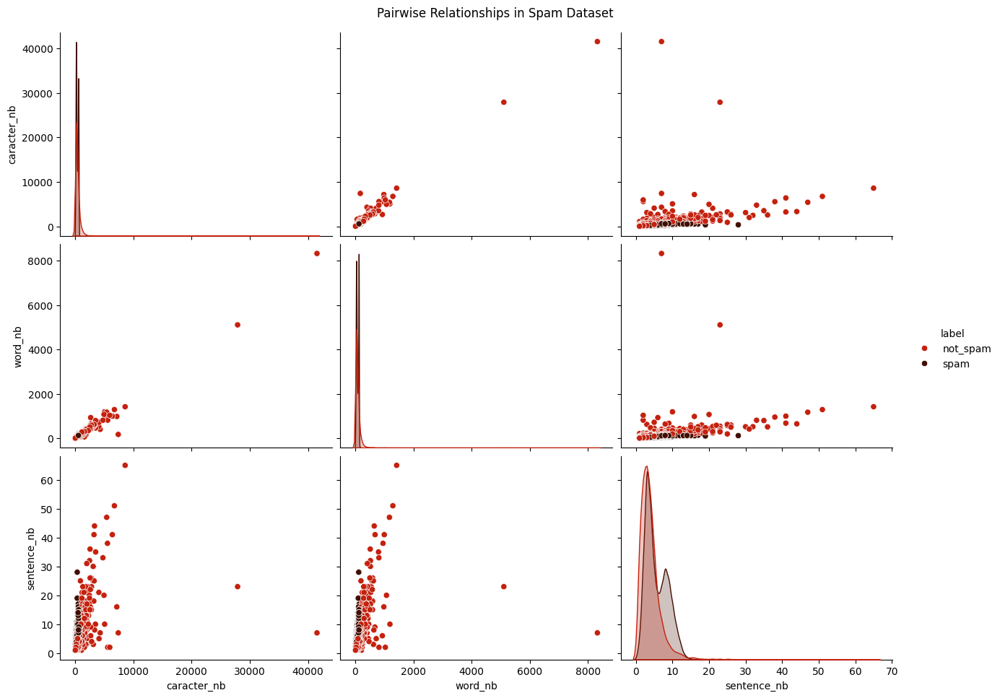

In [22]:
# Import visualization librairies
import seaborn as sns
import matplotlib.pyplot as plt

# Plot figure
fig = sns.pairplot(data=df_spam, hue="label", palette=["#C4210E", "#410F01"], height=3.15, aspect=1.35)
fig.fig.suptitle("Pairwise Relationships in Spam Dataset", y=1.02)
plt.show(fig);

The distribution analysis confirms the observations made earlier, with the positive asymmetry pulling the average upwards being particularly visible.

To better understand the specific characteristics of the text we will be working with, displaying it in its raw form may be more insightful than presenting it in a dataframe.

In [23]:
# Display raw data
for text in df_spam['text']:
    print(repr(text))

'hey I am looking for Xray baggage datasets can you provide me with the same '
'"Get rich quick! Make millions in just days with our new and revolutionary system! Don\'t miss out on this amazing opportunity!"\n\n'
"URGENT MESSAGE: YOU WON'T BELIEVE WHAT WE HAVE TO OFFER!!!\n\nHey you! Yeah, you with the eyes reading this right now. Do you want to be the coolest cat on the block? Do you want to get all the likes, hearts and emojis? Do you want to be ~*POPULAR*~? Well, we have the solution for you.\n\nIntroducing our brand new feature that will blow your mind and your feed! We can't give away too many details, but let's just say it involves puppies, unicorns, and a drum kit.\n\nBut wait, there's more! Sign up"
"[Google AI Blog: Contributing Data to Deepfake Detection Research](https://ai.googleblog.com/2019/09/contributing-data-to-deepfake-detection.html)\n\n&gt;Today \\[September 24, 2019\\], in collaboration with [Jigsaw](https://jigsaw.google.com/), we're announcing the release of a l

In [24]:
import re # regex
from collections import Counter 

In [ ]:
# Function to extract emoticones from text
def extract_emojis(text):
    # Each Unicode correspond to a type of emoji 
    emoji_pattern = re.compile(
        "["
        "\U0001F600-\U0001F64F"  # Smileys et émotions
        "\U0001F300-\U0001F5FF"  # Symboles divers
        "\U0001F680-\U0001F6FF"  # Transport
        "\U0001F700-\U0001F77F"  # Objets
        "\U0001F900-\U0001F9FF"  # Visages et objets divers
        "\U00002600-\U000026FF"  # Divers (soleil, flèches)
        "]+", 
        flags=re.UNICODE
    )
    return emoji_pattern.findall(text)

# Add a 'emojis' column with emoticones extract from text
df_spam['emojis'] = df_spam['text'].apply(extract_emojis) 

# Count the overall frequencies of emojis by category
def count_emojis_by_label(df, label):
    filtered_df = df[df['label'] == label]
    all_emojis = [emoji for emojis in filtered_df['emojis'] for emoji in emojis] # 
    return Counter(all_emojis)

spam_emoji_counts = count_emojis_by_label(df_spam, 'spam')
non_spam_emoji_counts = count_emojis_by_label(df_spam, 'not_spam')

# Display results
print("Emoticones in spam text :", spam_emoji_counts)
print("Emoticones in non-spam text :", non_spam_emoji_counts)

# Create a comparative emoticones frequences dataframe by label
emoji_analysis = pd.DataFrame({
    'spam': dict(spam_emoji_counts),
    'not_spam': dict(non_spam_emoji_counts)
}).fillna(0)

emoji_analysis['total'] = emoji_analysis['spam'] + emoji_analysis['not_spam']
emoji_analysis['spam_ratio'] = emoji_analysis['spam'] / emoji_analysis['total']

print("\nEmoticones Analysis :")
emoji_analysis.head(10)

Emoticones in spam text : Counter({'🚨': 282, '🔥🔥🔥': 178, '🤑🤑🤑': 176, '🔥': 170, '💰💰💰': 162, '🚨🚨🚨': 128, '🤑': 120, '🎉🎉🎉': 102, '💥': 100, '💰': 87, '♀': 82, '👉': 80, '🎉': 67, '🛍': 64, '💥💥💥': 63, '💸💸💸': 62, '😱😱😱': 62, '👀': 58, '🚨🚨': 53, '🏃': 53, '😍😍😍': 51, '🎁': 48, '👉🏼': 46, '♂': 45, '🚀': 44, '😎': 43, '🤑🤑': 42, '👉👉👉': 42, '😱': 41, '🌟': 40, '🔥🔥': 40, '💰💰': 39, '🚀🚀🚀': 35, '😍': 35, '🤩🤩🤩': 30, '🤩': 30, '🤯': 29, '🙌': 28, '💸': 28, '👈': 27, '🤑💰': 26, '🎉🎉': 26, '🤯🤯🤯': 24, '🎁🎁🎁': 24, '💻': 22, '🙌🙌🙌': 21, '😎😎😎': 20, '📣': 19, '👈👈👈': 19, '👀👀👀': 19, '👈🏼': 19, '🌟🌟🌟': 18, '🏝': 18, '🙌🏼': 17, '📈': 17, '💪💪💪': 16, '👋': 16, '💸💸': 14, '😍😍': 14, '😉': 14, '👍': 13, '🏋': 13, '💯': 13, '💁': 13, '🤑💰💸': 13, '📣📣📣': 12, '💵💵💵': 12, '😱😱': 12, '👀👀': 12, '💯💯💯': 11, '📢📢📢': 11, '💪': 11, '🎁🎁': 11, '📢': 11, '🤮🤮🤮': 10, '📱📱📱': 10, '📱': 10, '😜': 10, '★': 10, '💥💥': 9, '🤢': 9, '💰💸🤑': 9, '👉🏼👉🏼👉🏼': 9, '🙌🙌': 9, '💪🏼': 9, '🙅': 9, '🌶': 8, '👨': 8, '👉👉': 8, '⚡': 8, '🚨🚨🚨🚨': 8, '💨': 8, '📢📢': 8, '💻💻💻': 8, '🏖': 8, '👯': 8, '💰💸💵': 8, '🤢🤢🤢': 8, '🎉🎊'

,spam,not_spam,total,spam_ratio
👋👋👋,4.0,0.0,4.0,1.0
😴,6.0,0.0,6.0,1.0
😒,2.0,0.0,2.0,1.0
🌶,8.0,0.0,8.0,1.0
💪🏃,1.0,0.0,1.0,1.0
♀,82.0,0.0,82.0,1.0
🥦,2.0,0.0,2.0,1.0
💪💪💪,16.0,0.0,16.0,1.0
🙌🙌🙌,21.0,0.0,21.0,1.0
🤩🤩🤩,30.0,0.0,30.0,1.0


This dataframe shows the number of times an emoji appears in the entire text and provides a ratio indicating the association of these emojis with the spam label.

In [26]:
emoji_analysis.spam_ratio.value_counts()

spam_ratio
1.000000    1184
0.000000      10
0.500000       3
0.600000       2
0.987654       1
0.952381       1
0.800000       1
0.428571       1
0.972222       1
0.666667       1
0.750000       1
0.333333       1
0.250000       1
Name: count, dtype: int64

Thus, the majority of emojis are found in texts classified as spam. This is a very valuable piece of information that we will need to leverage in our model.

## Data preprocessing : NLP

### Outliers Managing :

In [27]:
# Display stats text
stats = df_spam.describe().T
stats

,count,mean,std,min,25%,50%,75%,max
caracter_nb,10900.0,372.916422,590.466161,1.0,174.0,285.0,507.0,41544.0
word_nb,10900.0,75.624679,113.318933,1.0,36.0,58.0,106.0,8322.0
sentence_nb,10900.0,4.767982,3.238908,1.0,3.0,4.0,6.0,65.0


In [28]:
# Retrieve the mean and standard deviation for each type of token.
mean = stats.iloc[:,1]
std = stats.iloc[:,2]

In [29]:
mean['caracter_nb']

np.float64(372.9164220183486)

In [30]:
# Create a mask to filter data and delete outliers/underleirs (3*std of mean)
mask = (
    (df_spam['caracter_nb'] >= (mean['caracter_nb'] - 3 * std['caracter_nb'])) &
    (df_spam['caracter_nb'] <= (mean['caracter_nb'] + 3 * std['caracter_nb'])) &
    (df_spam['word_nb'] >= (mean['word_nb'] - 3 * std['word_nb'])) &
    (df_spam['word_nb'] <= (mean['word_nb'] + 3 * std['word_nb'])) &
    (df_spam['sentence_nb'] >= (mean['sentence_nb'] - 3 * std['sentence_nb'])) &
    (df_spam['sentence_nb'] <= (mean['sentence_nb'] + 3 * std['sentence_nb']))
)

In [31]:
# Apply mask
df_spam = df_spam[mask]
print(f"Row numbers after removing outliers and underliers: {df_spam.shape[0]}")
print(f"Row number before mask: {df_spam_copy.shape[0]}")
print(f"The mask has removed {df_spam_copy.shape[0] - df_spam.shape[0]} row")

Row numbers after removing outliers and underliers: 10805
Row number before mask: 10900
The mask has removed 95 row


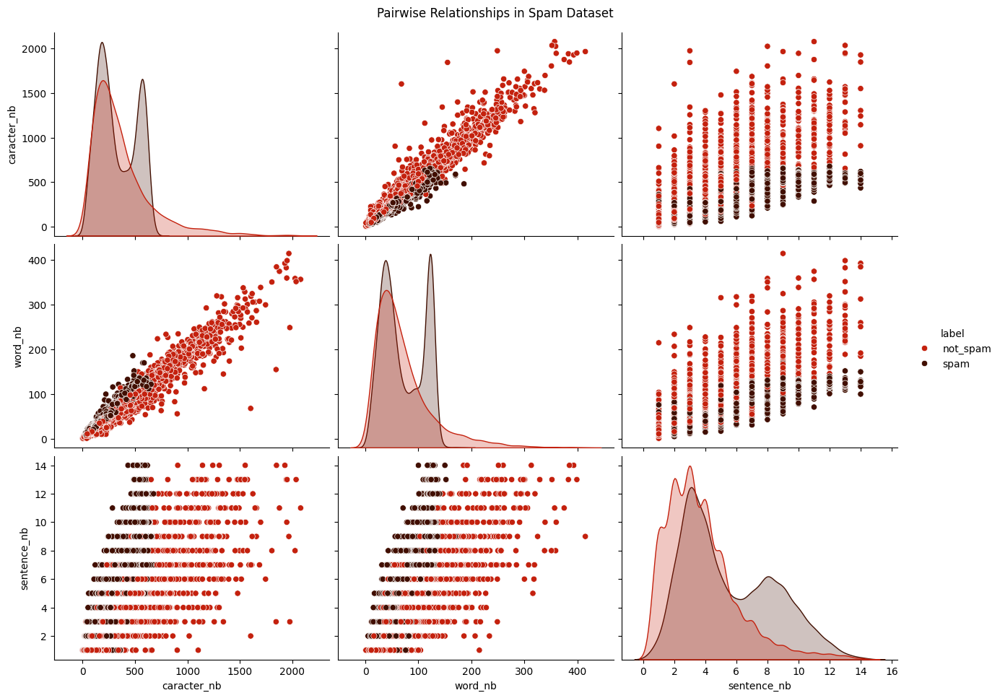

In [32]:
# Pairplot df_spam without outliers/underliers to visualize distirbution improvment
fig = sns.pairplot(data=df_spam, hue="label", palette=["#C4210E", "#410F01"], height=3.15, aspect=1.35)
fig.fig.suptitle("Pairwise Relationships in Spam Dataset", y=1.02)
plt.show(fig);

We can observe that the data is now more closely grouped around the mean, and the positive skewness is much less pronounced.

In [33]:
df_spam.head()

,text,label,caracter_nb,word_nb,sentence_nb,emojis
0,hey I am looking for Xray baggage datasets can...,not_spam,76,15,1,[]
1,"""Get rich quick! Make millions in just days wi...",spam,129,27,3,[]
2,URGENT MESSAGE: YOU WON'T BELIEVE WHAT WE HAVE...,spam,495,122,11,[]
3,[Google AI Blog: Contributing Data to Deepfake...,not_spam,1057,160,3,[]
4,Trying to see if anyone already has timestamps...,not_spam,223,47,3,[]


### Preprocessing on text

In [34]:
def preprocess_text(text):
    """
    perform some regex preprocessing to clean data:
    1. text to lowercase
    2. Clean up the punctuation by keeping !, ?, and .
    3. Removes links, HTML/Markdown characters and multiple spaces.
    4. Keeps emoticons.
    """
    # Convert to lowercase
    text = text.lower()
    
    # Delete links
    text = re.sub(r'http\S+|www\S+|https\S+', '', text)
    
    # Delete HTML/Markdown caracters
    text = re.sub(r'<.*?>', '', text)
    text = re.sub(r'&amp;', '&', text)
    text = re.sub(r'&gt;', '>', text)
    
    # Clean up punctuation (keep emoticons, words, spaces, !, ?, .)
    text = re.sub(r'[^\w\s!?.,\U0001F600-\U0001F64F\U0001F300-\U0001F5FF\U0001F680-\U0001F6FF\U0001F700-\U0001F77F\U0001F900-\U0001F9FF]+', '', text)
    
    # Réduire les espaces multiples
    text = re.sub(r'\s+', ' ', text).strip()
    
    return text

In [35]:
# Create a preprocess column and apply preprocessing on text
df_spam['preprocess'] = df_spam['text'].apply(preprocess_text)

In [36]:
def replace_numeric_characters(text):
    """
    Replaces numeric characters resembling letters with their alphabetic equivalents
    only if the number is part of a word.
    - 3 becomes e
    - 0 becomes o
    - 4 becomes a
    
    Arguments:
    - text (str): Raw text input.
    
    Returns:
    - str: Text with the substitutions applied.
    """
    substitutions = {
        '3': 'e',
        '0': 'o',
        '4': 'a'
    }
    
    def replace_match(match):
        word = match.group()
        for num, char in substitutions.items():
            word = word.replace(num, char)
        return word

    # Replace only words containing numbers
    return re.sub(r'\b\w*\d\w*\b', replace_match, text)

In [37]:
# Apply function to the 'preprocess' column
df_spam['preprocess'] = df_spam['preprocess'].apply(replace_numeric_characters)

In [38]:
# Display results
for text in df_spam['preprocess']:
    print(repr(text))

'hey i am looking for xray baggage datasets can you provide me with the same'
'get rich quick! make millions in just days with our new and revolutionary system! dont miss out on this amazing opportunity!'
'urgent message you wont believe what we have to offer!!! hey you! yeah, you with the eyes reading this right now. do you want to be the coolest cat on the block? do you want to get all the likes, hearts and emojis? do you want to be popular? well, we have the solution for you. introducing our brand new feature that will blow your mind and your feed! we cant give away too many details, but lets just say it involves puppies, unicorns, and a drum kit. but wait, theres more! sign up'
'google ai blog contributing data to deepfake detection research today september 2a, 2o19, in collaboration with jigsaw were announcing the release of a large dataset of visual deepfakes weve produced that has been incorporated into the technical university of munich and the university federico ii of naples 

- Decision to keep emojis
- Decision to keep repetitive punctuations that may provide context, such as !!!, ??, ..

In [39]:
# Convert category in two classes 0 : not_spam  abd 1 : spam
df_spam['label'] = df_spam['label'].apply(lambda x: 0 if x == 'not_spam' else 1)

# Remove the label column and place it in position 0.
label = df_spam.pop('label')
df_spam.insert(0, 'label', label)

In [40]:
df_spam.head()

,label,text,caracter_nb,word_nb,sentence_nb,emojis,preprocess
0,0,hey I am looking for Xray baggage datasets can...,76,15,1,[],hey i am looking for xray baggage datasets can...
1,1,"""Get rich quick! Make millions in just days wi...",129,27,3,[],get rich quick! make millions in just days wit...
2,1,URGENT MESSAGE: YOU WON'T BELIEVE WHAT WE HAVE...,495,122,11,[],urgent message you wont believe what we have t...
3,0,[Google AI Blog: Contributing Data to Deepfake...,1057,160,3,[],google ai blog contributing data to deepfake d...
4,0,Trying to see if anyone already has timestamps...,223,47,3,[],trying to see if anyone already has timestamps...


### STOP words / Tokenizer / Lemmatisation

To process natural language, we will use the spaCy library, which enables us to perform various linguistic processing tasks. This library will allow us to:

Perform tokenization
Conduct part-of-speech tagging
Detect similarities
Perform lemmatization (retain the root form of words)

In [41]:
import spacy

# load langage model
nlp = spacy.load("en_core_web_sm")

# Test langage model
doc = nlp("This is a test sentence.")
print([(token.text, token.pos_) for token in doc])


[('This', 'PRON'), ('is', 'AUX'), ('a', 'DET'), ('test', 'NOUN'), ('sentence', 'NOUN'), ('.', 'PUNCT')]


It is also important to remove STOP WORDS to help our model better understand and focus on the most relevant parts of the text for analysis and prediction.

In [42]:
# Import Stop words dictionnary
from spacy.lang.en.stop_words import STOP_WORDS
# Print stop words
print(STOP_WORDS)

{'only', 'also', 'go', 'hereby', 'meanwhile', 'some', 'upon', 'itself', 'them', 'under', 'moreover', '‘ve', 'everywhere', 'me', '‘m', 'do', 'others', 'off', 'everything', 'show', 'was', 'am', 'used', 'should', 'beside', 'often', 'on', 'and', 'namely', 'are', '‘ll', 'before', 'wherever', 'though', 'cannot', 'after', 'does', 'top', 'name', 'twenty', "'ll", 'towards', 'then', 'of', 'call', "'s", 'give', 'part', 'must', 'see', 'just', 'twelve', 'ours', 'there', 'i', 'without', '‘re', 'within', 'noone', 'amongst', 'becoming', 'hereafter', 'put', 'somewhere', 'make', 'most', 'never', 'empty', 'somehow', 'please', 'fifteen', 'neither', 'everyone', 'many', 'they', 'another', 'against', 'why', 'while', 'whereafter', 'seem', 'two', 'your', 'nowhere', 'throughout', 'but', 'myself', 'sixty', 'their', 'up', 'seeming', 'behind', 'herein', 'rather', 'thereby', 'perhaps', 'in', 'his', 'be', "'ve", 'themselves', "'d", 'done', 'further', 'wherein', 'sometime', 'therefore', 'had', 'not', 'might', 'around

In [43]:
# tokenized text
token_process_text = df_spam['preprocess'].apply(lambda x: nlp(x))

In [44]:
# Remove stop-words and apply Lemmatization
token_process_text = token_process_text.apply(lambda x: [token.lemma_ for token in x if token.text not in STOP_WORDS])
token_process_text

0             [hey, look, xray, baggage, dataset, provide]
1        [rich, quick, !, million, day, new, revolution...
2        [urgent, message, will, not, believe, offer, !...
3        [google, ai, blog, contribute, datum, deepfake...
4        [try, timestamp, key, event, happen, president...
                               ...                        
10895                                    [good, usable, ?]
10896    [m, sure, absolute, good, sub, ,, search, show...
10897    [love, know, good, data, set, multiple, regres...
10898    [fields, hashrate, ,, vram, ,, tdp, ,, msrp, ,...
10899    [feelin, like, get, attention, social, medium,...
Name: preprocess, Length: 10805, dtype: object

In [45]:
# Visualize results on text
for token in token_process_text:
    print(token)

['hey', 'look', 'xray', 'baggage', 'dataset', 'provide']
['rich', 'quick', '!', 'million', 'day', 'new', 'revolutionary', 'system', '!', 'not', 'miss', 'amazing', 'opportunity', '!']
['urgent', 'message', 'will', 'not', 'believe', 'offer', '!', '!', '!', 'hey', '!', 'yeah', ',', 'eye', 'read', 'right', '.', 'want', 'cool', 'cat', 'block', '?', 'want', 'like', ',', 'heart', 'emoji', '?', 'want', 'popular', '?', ',', 'solution', '.', 'introduce', 'brand', 'new', 'feature', 'blow', 'mind', 'feed', '!', 'not', 'away', 'detail', ',', 'let', 'involve', 'puppy', ',', 'unicorn', ',', 'drum', 'kit', '.', 'wait', ',', 's', '!', 'sign']
['google', 'ai', 'blog', 'contribute', 'datum', 'deepfake', 'detection', 'research', 'today', 'september', '2a', ',', '2o19', ',', 'collaboration', 'jigsaw', 'announce', 'release', 'large', 'dataset', 'visual', 'deepfake', 've', 'produce', 'incorporate', 'technical', 'university', 'munich', 'university', 'federico', 'ii', 'naples', 'new', 'faceforensic', 'benchmar

We can notice than some messages are written in SMS language. WHICH means that the words are not referenced in the stop words dictionnary (example: you = u, to = 2, second = 2nd...). We need to handle this problem

In [46]:
# Add a clean token column (detokenized)
df_spam["clean_token"] = [" ".join(x) for x in token_process_text]
df_spam.head(20)

,label,text,caracter_nb,word_nb,sentence_nb,emojis,preprocess,clean_token
0,0,hey I am looking for Xray baggage datasets can...,76,15,1,[],hey i am looking for xray baggage datasets can...,hey look xray baggage dataset provide
1,1,"""Get rich quick! Make millions in just days wi...",129,27,3,[],get rich quick! make millions in just days wit...,rich quick ! million day new revolutionary sys...
2,1,URGENT MESSAGE: YOU WON'T BELIEVE WHAT WE HAVE...,495,122,11,[],urgent message you wont believe what we have t...,urgent message will not believe offer ! ! ! he...
3,0,[Google AI Blog: Contributing Data to Deepfake...,1057,160,3,[],google ai blog contributing data to deepfake d...,google ai blog contribute datum deepfake detec...
4,0,Trying to see if anyone already has timestamps...,223,47,3,[],trying to see if anyone already has timestamps...,try timestamp key event happen presidential de...
5,0,Bridging the gap between artificial intelligen...,797,157,4,[],bridging the gap between artificial intelligen...,bridge gap artificial intelligence business an...
6,0,hi all any good leads on datasets for fuel pri...,102,20,2,[],hi all any good leads on datasets for fuel pri...,hi good lead dataset fuel price ad fuel consum...
7,0,"\n\nHi everyone,\n\nFor my thesis I'm looking...",308,62,5,[],"hi everyone, for my thesis im looking for a da...","hi , thesis m look daily count subscriber subr..."
8,0,I'm looking for a large dataset of n-grams (pr...,848,151,6,[],im looking for a large dataset of ngrams prefe...,m look large dataset ngram preferably agram 5g...
9,1,Check out these amazing weight loss pills! The...,203,44,4,[],check out these amazing weight loss pills! the...,check amazing weight loss pill ! guarantee she...


As mentioned earlier, emojis represent valuable information that needs to be leveraged effectively.

In [ ]:
# Compile a regular expression pattern to detect emojis and various symbols
emoji_pattern = re.compile(
    r"[\U0001F600-\U0001F64F]|"  # Smileys
    r"[\U0001F300-\U0001F5FF]|"  # Various symbols
    r"[\U0001F680-\U0001F6FF]|"  # Transport and objects
    r"[\U0001F700-\U0001F77F]|"  # Additional symbols
    r"[\U0001F900-\U0001F9FF]|"  # Extra emotions and gestures
    r"[\U0001FA70-\U0001FAFF]|"  # Miscellaneous objects
    r"[\u2600-\u26FF]|"          # Various symbols (Sun, clouds, etc.)
    r"[\u2700-\u27BF]",          # Miscellaneous sym
    flags=re.UNICODE
)

In [48]:
# Extract emojis from each text in the 'clean_token' column using the compiled emoji pattern
# and create a new column 'emojis' to store the list of detected emojis for each text.
df_spam['emojis'] = df_spam['clean_token'].apply(lambda x: emoji_pattern.findall(x))


In [49]:
df_spam.head(20)

,label,text,caracter_nb,word_nb,sentence_nb,emojis,preprocess,clean_token
0,0,hey I am looking for Xray baggage datasets can...,76,15,1,[],hey i am looking for xray baggage datasets can...,hey look xray baggage dataset provide
1,1,"""Get rich quick! Make millions in just days wi...",129,27,3,[],get rich quick! make millions in just days wit...,rich quick ! million day new revolutionary sys...
2,1,URGENT MESSAGE: YOU WON'T BELIEVE WHAT WE HAVE...,495,122,11,[],urgent message you wont believe what we have t...,urgent message will not believe offer ! ! ! he...
3,0,[Google AI Blog: Contributing Data to Deepfake...,1057,160,3,[],google ai blog contributing data to deepfake d...,google ai blog contribute datum deepfake detec...
4,0,Trying to see if anyone already has timestamps...,223,47,3,[],trying to see if anyone already has timestamps...,try timestamp key event happen presidential de...
5,0,Bridging the gap between artificial intelligen...,797,157,4,[],bridging the gap between artificial intelligen...,bridge gap artificial intelligence business an...
6,0,hi all any good leads on datasets for fuel pri...,102,20,2,[],hi all any good leads on datasets for fuel pri...,hi good lead dataset fuel price ad fuel consum...
7,0,"\n\nHi everyone,\n\nFor my thesis I'm looking...",308,62,5,[],"hi everyone, for my thesis im looking for a da...","hi , thesis m look daily count subscriber subr..."
8,0,I'm looking for a large dataset of n-grams (pr...,848,151,6,[],im looking for a large dataset of ngrams prefe...,m look large dataset ngram preferably agram 5g...
9,1,Check out these amazing weight loss pills! The...,203,44,4,[],check out these amazing weight loss pills! the...,check amazing weight loss pill ! guarantee she...


In [50]:
# Delete words that have less than 2 letters or less except punctuations
df_spam['clean_token'] = df_spam['clean_token'].apply(
    lambda x: ' '.join(
        word for word in x.split() 
        if len(word) >= 3 or word in {'.', '!', '?'} or word.isdigit()
    )
)

In [51]:
df_spam.head(20)

,label,text,caracter_nb,word_nb,sentence_nb,emojis,preprocess,clean_token
0,0,hey I am looking for Xray baggage datasets can...,76,15,1,[],hey i am looking for xray baggage datasets can...,hey look xray baggage dataset provide
1,1,"""Get rich quick! Make millions in just days wi...",129,27,3,[],get rich quick! make millions in just days wit...,rich quick ! million day new revolutionary sys...
2,1,URGENT MESSAGE: YOU WON'T BELIEVE WHAT WE HAVE...,495,122,11,[],urgent message you wont believe what we have t...,urgent message will not believe offer ! ! ! he...
3,0,[Google AI Blog: Contributing Data to Deepfake...,1057,160,3,[],google ai blog contributing data to deepfake d...,google blog contribute datum deepfake detectio...
4,0,Trying to see if anyone already has timestamps...,223,47,3,[],trying to see if anyone already has timestamps...,try timestamp key event happen presidential de...
5,0,Bridging the gap between artificial intelligen...,797,157,4,[],bridging the gap between artificial intelligen...,bridge gap artificial intelligence business an...
6,0,hi all any good leads on datasets for fuel pri...,102,20,2,[],hi all any good leads on datasets for fuel pri...,good lead dataset fuel price fuel consumption ...
7,0,"\n\nHi everyone,\n\nFor my thesis I'm looking...",308,62,5,[],"hi everyone, for my thesis im looking for a da...",thesis look daily count subscriber subreddit ....
8,0,I'm looking for a large dataset of n-grams (pr...,848,151,6,[],im looking for a large dataset of ngrams prefe...,look large dataset ngram preferably agram 5gra...
9,1,Check out these amazing weight loss pills! The...,203,44,4,[],check out these amazing weight loss pills! the...,check amazing weight loss pill ! guarantee she...


In [52]:
df_spam.dtypes

label           int64
text           object
caracter_nb     int64
word_nb         int64
sentence_nb     int64
emojis         object
preprocess     object
clean_token    object
dtype: object

In [53]:
# Check than all the documentss in 'clean_token' are str
mask = df_spam.clean_token.apply(lambda x: type(x)==str)
mask.value_counts()

df_spam_clean = df_spam[mask]

In [54]:
import tensorflow as tf
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences

In [55]:
# Instance of the Tokenizer class from the Keras preprocessing library to keep 2000 most frequent words
tokenizer = tf.keras.preprocessing.text.Tokenizer(num_words=2000, oov_token="out_of_vocab")# None ou "<UNK>"

# Build the vocabulary based on the frequency of words
# fit the tokenizer on the texts in this step the tokenizer will list all unique tokens in the text
# and associate them with a specific integer.
tokenizer.fit_on_texts(df_spam_clean["clean_token"])

# This step will effectively transform the texts into sequences of indices
df_spam_clean["text_encoded"] = tokenizer.texts_to_sequences(df_spam_clean["clean_token"])

# Check vocabulary size
vocab_size_effective = len([k for k, v in tokenizer.word_index.items() if v < tokenizer.num_words])
print(f"vocabulary size : {vocab_size_effective}")

# Check vocabulary size + token out of vocab 
# The OOV token is assigned to tokens that are not among the 2000 most frequent words in the dataset.
vocab_size_text = tokenizer.num_words 
print(f"total vocabulary size with OOV : {vocab_size_text}")

# Sometimes the preprocessing removes all the words in a string (because they contain
# only stopwords for example) so we calculate the length in order to filter out
# those records
df_spam_clean["len_text"] = df_spam_clean["text_encoded"].apply(lambda x: len(x))
df_spam_clean = df_spam_clean[df_spam_clean["len_text"] != 0]

vocabulary size : 1999
total vocabulary size with OOV : 2000


In [56]:
df_spam_clean.head()

,label,text,caracter_nb,word_nb,sentence_nb,emojis,preprocess,clean_token,text_encoded,len_text
0,0,hey I am looking for Xray baggage datasets can...,76,15,1,[],hey i am looking for xray baggage datasets can...,hey look xray baggage dataset provide,"[32, 5, 1, 1, 4, 184]",6
1,1,"""Get rich quick! Make millions in just days wi...",129,27,3,[],get rich quick! make millions in just days wit...,rich quick ! million day new revolutionary sys...,"[39, 45, 149, 60, 10, 320, 137, 2, 18, 9, 44]",11
2,1,URGENT MESSAGE: YOU WON'T BELIEVE WHAT WE HAVE...,495,122,11,[],urgent message you wont believe what we have t...,urgent message will not believe offer ! ! ! he...,"[310, 270, 37, 2, 71, 16, 32, 798, 510, 280, 2...",40
3,0,[Google AI Blog: Contributing Data to Deepfake...,1057,160,3,[],google ai blog contributing data to deepfake d...,google blog contribute datum deepfake detectio...,"[239, 878, 1822, 3, 1, 486, 162, 83, 1, 763, 1...",54
4,0,Trying to see if anyone already has timestamps...,223,47,3,[],trying to see if anyone already has timestamps...,try timestamp key event happen presidential de...,"[41, 1, 863, 422, 314, 1823, 1, 119, 1, 562, 1...",15


In [57]:
df_spam_clean.isnull().sum()

label           0
text            0
caracter_nb     0
word_nb         0
sentence_nb     0
emojis          0
preprocess      0
clean_token     0
text_encoded    0
len_text        0
dtype: int64

In [58]:
# Display the lookup table for the words and indices
text_vocab = tokenizer.index_word
text_vocab

{1: 'out_of_vocab',
 2: 'not',
 3: 'datum',
 4: 'dataset',
 5: 'look',
 6: 'like',
 7: 'find',
 8: 'get',
 9: 'amazing',
 10: 'new',
 11: 'time',
 12: 'want',
 13: 'social',
 14: 'know',
 15: 'need',
 16: 'offer',
 17: 'free',
 18: 'miss',
 19: 'thank',
 20: 'deal',
 21: 'good',
 22: 'wait',
 23: 'follower',
 24: 'post',
 25: 'help',
 26: 'network',
 27: 'exclusive',
 28: 'work',
 29: 'right',
 30: 'click',
 31: 'product',
 32: 'hey',
 33: 'late',
 34: 'medium',
 35: 'platform',
 36: 'friend',
 37: 'will',
 38: 'money',
 39: 'rich',
 40: 'share',
 41: 'try',
 42: 'tired',
 43: 'link',
 44: 'opportunity',
 45: 'quick',
 46: 'sign',
 47: 'project',
 48: 'start',
 49: 'feature',
 50: 'ready',
 51: 'use',
 52: 'buy',
 53: 'join',
 54: 'check',
 55: 'life',
 56: '1',
 57: 'way',
 58: 'hot',
 59: 'set',
 60: 'day',
 61: 'content',
 62: 'people',
 63: 'information',
 64: 'weight',
 65: 'data',
 66: 'win',
 67: 'year',
 68: 'access',
 69: 'etc',
 70: 'big',
 71: 'believe',
 72: 'plus',
 73: 'u

In [59]:
# Index of all unique words in the text
tokenizer.word_index.values()

dict_values([1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 

In [60]:
# Number of unique words in the text
len(text_vocab)

18428

Thus, we chose to keep the 2000 most frequent words in the vocabulary, but the text contains over 18,000 unique words in total.

Now, to utilize emojis effectively, it is also necessary to create a vocabulary for them.

In [61]:
# Extract unique emojis from the 'emojis' column
unique_emojis = set(emoji for emojis in df_spam['emojis'] for emoji in emojis)

# If num_words is defined, the effective vocabulary size is limited
text_vocab_size = min(max(tokenizer.word_index.values()), tokenizer.num_words - 1)

# Offset for the emoji vocabulary
emoji_vocab_offset = text_vocab_size + 1  # Offset after the text vocabulary (+1 for padding/OOV)

# Create the emoji vocabulary
emoji_vocab = {emoji: idx + emoji_vocab_offset for idx, emoji in enumerate(sorted(unique_emojis))}

# Calculate the total size of the combined vocabulary for unified model
vocab_size_combined = text_vocab_size + len(emoji_vocab) + 1  # Add +1 to include padding

print(f"Text vocabulary size: {text_vocab_size}")
print(f"Emoji vocabulary size: {len(emoji_vocab)}")
print(f"Total combined vocabulary size: {vocab_size_combined}")

Text vocabulary size: 1999
Emoji vocabulary size: 356
Total combined vocabulary size: 2356


Make some verification to be sure than the both dictionnary are combined without overlapping

In [62]:
# Check the first few text indices
print(f"First text indices: {list(tokenizer.word_index.values())[:5]}")  # Sample of the first few text indices

# Check the first few emoji indices
print(f"First emoji indices: {list(emoji_vocab.values())[:5]}")  # Sample of the first few emoji indices

# Check index ranges
print(f"Text indices: 1 to {text_vocab_size}")
print(f"Emoji indices: {emoji_vocab_offset} to {emoji_vocab_offset + len(emoji_vocab) - 1}")

First text indices: [1, 2, 3, 4, 5]
First emoji indices: [2000, 2001, 2002, 2003, 2004]
Text indices: 1 to 1999
Emoji indices: 2000 to 2355


We have confirmation that the vocabularies are properly combined.

In [63]:
# Display emoji vocab
emoji_vocab

{'🌅': 2000,
 '🌈': 2001,
 '🌊': 2002,
 '🌌': 2003,
 '🌍': 2004,
 '🌎': 2005,
 '🌐': 2006,
 '🌞': 2007,
 '🌟': 2008,
 '🌪': 2009,
 '🌭': 2010,
 '🌮': 2011,
 '🌱': 2012,
 '🌴': 2013,
 '🌶': 2014,
 '🌷': 2015,
 '🌸': 2016,
 '🌺': 2017,
 '🌻': 2018,
 '🌼': 2019,
 '🌽': 2020,
 '🌿': 2021,
 '🍀': 2022,
 '🍂': 2023,
 '🍃': 2024,
 '🍅': 2025,
 '🍆': 2026,
 '🍇': 2027,
 '🍉': 2028,
 '🍊': 2029,
 '🍋': 2030,
 '🍌': 2031,
 '🍍': 2032,
 '🍎': 2033,
 '🍏': 2034,
 '🍐': 2035,
 '🍑': 2036,
 '🍒': 2037,
 '🍓': 2038,
 '🍔': 2039,
 '🍕': 2040,
 '🍖': 2041,
 '🍗': 2042,
 '🍛': 2043,
 '🍜': 2044,
 '🍝': 2045,
 '🍞': 2046,
 '🍟': 2047,
 '🍠': 2048,
 '🍦': 2049,
 '🍨': 2050,
 '🍩': 2051,
 '🍪': 2052,
 '🍰': 2053,
 '🍲': 2054,
 '🍳': 2055,
 '🍴': 2056,
 '🍵': 2057,
 '🍷': 2058,
 '🍹': 2059,
 '🍺': 2060,
 '🍻': 2061,
 '🍽': 2062,
 '🍾': 2063,
 '🍿': 2064,
 '🎀': 2065,
 '🎁': 2066,
 '🎃': 2067,
 '🎈': 2068,
 '🎉': 2069,
 '🎊': 2070,
 '🎓': 2071,
 '🎞': 2072,
 '🎟': 2073,
 '🎤': 2074,
 '🎥': 2075,
 '🎧': 2076,
 '🎨': 2077,
 '🎬': 2078,
 '🎮': 2079,
 '🎯': 2080,
 '🎵': 2081,
 '🏃': 2082,
 '🏆'

Once the vocabularies are created, we need to apply them to the emojis to assign each emoji its respective index.

In [64]:
# Check if the 'emojis' column contains lists
if df_spam_clean['emojis'].apply(lambda x: isinstance(x, list)).all():
    # Create a new column `emoji_indices` by applying the emoji vocabulary
    df_spam_clean['emoji_indices'] = df_spam_clean['emojis'].apply(
        lambda emojis: [emoji_vocab[emoji] for emoji in emojis if emoji in emoji_vocab]
    )
    print("'emoji_indices' column successfully created.")
else:
    print("Error: The 'emojis' column does not contain lists. Please check your data.")


'emoji_indices' column successfully created.


In [65]:
df_spam_clean.head(20)

,label,text,caracter_nb,word_nb,sentence_nb,emojis,preprocess,clean_token,text_encoded,len_text,emoji_indices
0,0,hey I am looking for Xray baggage datasets can...,76,15,1,[],hey i am looking for xray baggage datasets can...,hey look xray baggage dataset provide,"[32, 5, 1, 1, 4, 184]",6,[]
1,1,"""Get rich quick! Make millions in just days wi...",129,27,3,[],get rich quick! make millions in just days wit...,rich quick ! million day new revolutionary sys...,"[39, 45, 149, 60, 10, 320, 137, 2, 18, 9, 44]",11,[]
2,1,URGENT MESSAGE: YOU WON'T BELIEVE WHAT WE HAVE...,495,122,11,[],urgent message you wont believe what we have t...,urgent message will not believe offer ! ! ! he...,"[310, 270, 37, 2, 71, 16, 32, 798, 510, 280, 2...",40,[]
3,0,[Google AI Blog: Contributing Data to Deepfake...,1057,160,3,[],google ai blog contributing data to deepfake d...,google blog contribute datum deepfake detectio...,"[239, 878, 1822, 3, 1, 486, 162, 83, 1, 763, 1...",54,[]
4,0,Trying to see if anyone already has timestamps...,223,47,3,[],trying to see if anyone already has timestamps...,try timestamp key event happen presidential de...,"[41, 1, 863, 422, 314, 1823, 1, 119, 1, 562, 1...",15,[]
5,0,Bridging the gap between artificial intelligen...,797,157,4,[],bridging the gap between artificial intelligen...,bridge gap artificial intelligence business an...,"[1, 1, 1966, 1288, 292, 552, 258, 1, 684, 1, 1...",66,[]
6,0,hi all any good leads on datasets for fuel pri...,102,20,2,[],hi all any good leads on datasets for fuel pri...,good lead dataset fuel price fuel consumption ...,"[21, 456, 4, 1191, 91, 1191, 1019, 1162, 1, 18...",11,[]
7,0,"\n\nHi everyone,\n\nFor my thesis I'm looking...",308,62,5,[],"hi everyone, for my thesis im looking for a da...",thesis look daily count subscriber subreddit ....,"[544, 5, 321, 501, 1, 344, 100, 490, 1, 734, 6...",17,[]
8,0,I'm looking for a large dataset of n-grams (pr...,848,151,6,[],im looking for a large dataset of ngrams prefe...,look large dataset ngram preferably agram 5gra...,"[5, 218, 4, 1, 319, 1, 1, 1, 1, 28, 228, 1, 3,...",55,[]
9,1,Check out these amazing weight loss pills! The...,203,44,4,[],check out these amazing weight loss pills! the...,check amazing weight loss pill ! guarantee she...,"[54, 9, 64, 104, 92, 107, 417, 180, 60, 15, 47...",23,[]


In [66]:
import numpy as np

In [67]:
df_spam_clean['len_emoji'] = df_spam_clean['emoji_indices'].apply(lambda  x: len(x) if isinstance(x, list) else 0)

Calculate the global maximum size and the optimal size (at the 95th percentile) for the lists of texts and emojis to define the ideal dimensions for your sequences during processing.

 This approach helps to avoid excessively long padding for sequences that don't require it. By using the 95th percentile, we can handle most of the data efficiently while minimizing unnecessary padding.

In [68]:
from sklearn.model_selection import train_test_split

# Split data into train and test sets while balancing the labels.
train_df, test_df = train_test_split(df_spam_clean, test_size=0.2, random_state=42, stratify=df_spam_clean['label'])

# Split train set into train and val set while balancing the labels
train_df, val_df = train_test_split(train_df, test_size=0.2, random_state=42, stratify=train_df['label'])

# Check size
print(f"Train: {len(train_df)}, Validation: {len(val_df)}, Test: {len(test_df)}")

Train: 6900, Validation: 1726, Test: 2157


## Unified Architecture Model

We are almost done now, the texts have been converted into sequences of integers. However to form a tensorflow dataset, all the sequences must be of the same length, so we'll use padding. Padding will result in adding zeros at the end or the beginning of each sentence in order for all sequences to be of the same length.

For this we will use the `tf.keras.preprocessing.sequence.pad_sequences`

In [69]:
# Combined text and emoji encoded for each data set
train_combined = train_df.apply(lambda row: row['text_encoded'] + row['emoji_indices'], axis=1).tolist()
val_combined = val_df.apply(lambda row: row['text_encoded'] + row['emoji_indices'], axis=1).tolist()
test_combined = test_df.apply(lambda row: row['text_encoded'] + row['emoji_indices'], axis=1).tolist()

In [70]:
# Calculate the maximum sequence length across train_combined, val_combined, and test_combined
max_len_combined = max(
    max(len(sequence) for sequence in train_combined),  # Max length in train_combined
    max(len(sequence) for sequence in val_combined),    # Max length in val_combined
    max(len(sequence) for sequence in test_combined)    # Max length in test_combined
)
print(f"Maximum length across train_combined, val_combined, and test_combined: {max_len_combined}")

import numpy as np

# Calculate the 95th percentile sequence length across all combined sets
max_len_combined_opti = int(np.percentile(
    [len(sequence) for sequence in train_combined + val_combined + test_combined], 95
))
print(f"Length based on the 95th percentile: {max_len_combined_opti}")

Maximum length across train_combined, val_combined, and test_combined: 232
Length based on the 95th percentile: 55


In [71]:
# Maximal length for text
max_len_text = df_spam_clean['len_text'].max()
print(f"Global maximum length for texts: {max_len_text}")

# Maximal length at the 95th percentile for text
max_len_text_opti = int(np.percentile(df_spam_clean['len_text'], 95))
print(f"95th percentile length for texts: {max_len_text_opti}")

# Global maximum length for emojis
max_len_emoji = df_spam_clean['len_emoji'].max()
print(f"Global maximum length for emojis: {max_len_emoji}")

# 95th percentile length for emojis
max_len_emoji_opti = int(np.percentile(df_spam_clean['len_emoji'], 95))
print(f"95th percentile length for emojis: {max_len_emoji_opti}")

Global maximum length for texts: 232
95th percentile length for texts: 55
Global maximum length for emojis: 33
95th percentile length for emojis: 9


Calculate the global maximum size and the optimal size (at the 95th percentile) for the lists of texts and emojis to define the ideal dimensions for the sequences during processing.

 This approach helps to avoid excessively long padding for sequences that don't require it. By using the 95th percentile, we can handle most of the data efficiently while minimizing unnecessary padding.

In [72]:
# Dipslay the number of sequences longer than sequence opti
longer_than_opti = sum(len(seq) > max_len_combined_opti for seq in train_combined + val_combined + test_combined)
print(f"Nombre de séquences plus longues que le 95e percentile : {longer_than_opti}")

Nombre de séquences plus longues que le 95e percentile : 538


In [73]:
from tensorflow.keras.preprocessing.sequence import pad_sequences

# Padding to standardize the length of combined sequences
train_combined_pad = pad_sequences(train_combined, maxlen=max_len_combined_opti, padding='post')
val_combined_pad = pad_sequences(val_combined, maxlen=max_len_combined_opti, padding='post')
test_combined_pad = pad_sequences(test_combined, maxlen=max_len_combined_opti, padding='post')

In [74]:
# Shape train combined after padding
train_combined_pad.shape

# Display firt sequence of emoji and text combine for the train set after padding
print(train_combined_pad[0])

[   1  305   47  378    3  504  305   15    1  462   91    3  239    1
    1  334 1291   14  201  837    5    7 1419  189    1    1   67  603
   19    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0]


The shape is consistent; train_combine indeed has a length equivalent to the 95th percentile of the maximum sequence length.

In [75]:
import tensorflow as tf

batch_size = 32

# Create TensorFlowdatasets
train_ds = tf.data.Dataset.from_tensor_slices((train_combined_pad, train_df['label'])).batch(batch_size).shuffle(len(train_combined_pad)) # shuffle : helps improve the model's ability to generalize 
val_ds = tf.data.Dataset.from_tensor_slices((val_combined_pad, val_df['label'])).batch(batch_size)
test_ds = tf.data.Dataset.from_tensor_slices((test_combined_pad, test_df['label'])).batch(batch_size)

In [76]:
# Look at a batch of data 
for text, label in train_ds.take(1):
  print(text, label)

tf.Tensor(
[[  60  232  396 ...   62  110  744]
 [  66   17  243 ...    0    0    0]
 [  32    1   56 ...    0    0    0]
 ...
 [  32    5    3 ...    0    0    0]
 [   5    4 1353 ...    0    0    0]
 [ 393  117   33 ...    0    0    0]], shape=(32, 55), dtype=int32) tf.Tensor([0 1 1 1 0 0 1 1 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 0 0 0 1], shape=(32,), dtype=int64)


### Define the model
Now that the text has been properly encoded, we can proceed to building the model for classifying the texts. Our goal is to train the embedding layer, so we will keep the model simple.

It's important to note that the purpose of embedding is to map the vocabulary space to a lower-dimensional representation space. As a result, some words will have similar vectors in the representation space, while others will have more distinct vectors. However, the similarity or dissimilarity of words in this embedding space is not determined by a general understanding of the language. Instead, the mapping is learned through a supervised learning task.

In [77]:
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Embedding, Bidirectional, LSTM, Dense, Dropout, GlobalAveragePooling1D

# Paramètres
embedding_dim = 128 # vector dimension
lstm_units = 64 # neuron numbers 

# Inputs
input_layer = Input(shape=(max_len_combined_opti,), name="input_combined")
print(f"Input shape : {input_layer.shape}")

# Embedding avec mask_zero=True
embedding_layer = Embedding(input_dim=vocab_size_combined, output_dim=embedding_dim, mask_zero=True)(input_layer)
print(f"Shape after Embedding : {embedding_layer.shape}")

# LSTM bidirectionnal
lstm_layer = Bidirectional(LSTM(lstm_units, return_sequences=False, dropout = 0.3))(embedding_layer)
print(f"Shape after LSTM bidirectionnel : {lstm_layer.shape}")

# Dense Layers
dense_layer = Dense(64, activation='relu')(lstm_layer)
print(f"Shape after Dense (64 neurons) : {dense_layer.shape}")

dropout_layer = Dropout(0.5)(dense_layer)
print(f"Shape after Dropout : {dropout_layer.shape}")

output_layer = Dense(1, activation='sigmoid', name="output")(dropout_layer)
print(f"Shape after dense (1 neuron) : {output_layer.shape}")

# Final model
model_unified = Model(inputs=input_layer, outputs=output_layer)

# model structure
model_unified.summary()

Input shape : (None, 55)
Shape after Embedding : (None, 55, 128)
Shape after LSTM bidirectionnel : (None, 128)
Shape after Dense (64 neurons) : (None, 64)
Shape after Dropout : (None, 64)
Shape after dense (1 neuron) : (None, 1)


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_combined      │ (None, 55)        │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ embedding           │ (None, 55, 128)   │    301,568 │ input_combined[0… │
│ (Embedding)         │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ not_equal           │ (None, 55)        │          0 │ input_combined[0… │
│ (NotEqual)          │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bidirectional       │ (None, 128)       │     98,816 │ embedding[0][0],  │
│ (Bidirectional)     │                   │            │ not_equal[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense (Dense)       │ (None, 64)        │      8,256 │ bidirectional[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout (Dropout)   │ (None, 64)        │          0 │ dense[0][0]       │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ output (Dense)      │ (None, 1)         │         65 │ dropout[0][0]     │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 408,705 (1.56 MB)

 Trainable params: 408,705 (1.56 MB)

 Non-trainable params: 0 (0.00 B)

In [78]:
print(model_unified.input)

<KerasTensor shape=(None, 55), dtype=float32, sparse=False, name=input_combined>


In [79]:
import keras
keras.utils.plot_model(model_unified)

You must install graphviz (see instructions at https://graphviz.gitlab.io/download/) for `plot_model` to work.


In [80]:
import tensorflow as tf

# Model compilation with the Adam optimizer, loss function, and evaluation metrics
optimizer = tf.keras.optimizers.Adam()

model_unified.compile(
    optimizer=optimizer,
    loss=tf.keras.losses.BinaryCrossentropy(),
    metrics=[
        tf.keras.metrics.BinaryAccuracy(name="accuracy"),  # Ajout de l'accuracy
        tf.keras.metrics.FalseNegatives(name="false_negatives"),
        tf.keras.metrics.TrueNegatives(name="true_negatives"),
        tf.keras.metrics.FalsePositives(name="false_positives"),
        tf.keras.metrics.TruePositives(name="true_positives")
    ]
)

In [81]:
# Model training
history = model_unified.fit(
    train_ds,                   
    validation_data=val_ds,    
    epochs=20,                    
)                                 

# Évaluate model on test set
results = model_unified.evaluate(test_ds)

# Display results
print(f"Loss on test set : {results[0]:.4f}")  # first value is loss
print(f"Accuracy on test set : {results[1]:.4f}")  # second value is accuracy

Epoch 1/20
216/216 ━━━━━━━━━━━━━━━━━━━━ 14s 39ms/step - accuracy: 0.8996 - false_negatives: 153.0415 - false_positives: 41.9816 - loss: 0.2715 - true_negatives: 1681.9216 - true_positives: 1599.4608 - val_accuracy: 0.9942 - val_false_negatives: 9.0000 - val_false_positives: 1.0000 - val_loss: 0.0257 - val_true_negatives: 846.0000 - val_true_positives: 870.0000
Epoch 2/20
216/216 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - accuracy: 0.9967 - false_negatives: 3.1521 - false_positives: 8.4378 - loss: 0.0107 - true_negatives: 1690.3411 - true_positives: 1783.9862 - val_accuracy: 0.9954 - val_false_negatives: 6.0000 - val_false_positives: 2.0000 - val_loss: 0.0147 - val_true_negatives: 845.0000 - val_true_positives: 873.0000
Epoch 3/20
216/216 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - accuracy: 0.9979 - false_negatives: 2.4055 - false_positives: 4.9770 - loss: 0.0067 - true_negatives: 1708.4562 - true_positives: 1761.2858 - val_accuracy: 0.9948 - val_false_negatives: 2.0000 - val_false_positives: 7.0000 

In [ ]:
from sklearn.metrics import accuracy_score, f1_score, classification_report, confusion_matrix

# Predictions on test set
y_pred_classes = model_unified.predict(test_ds)  # Prediction results in the form of probabilities
y_pred = (y_pred_classes > 0.5).astype(int).flatten()  # Transform probzabilities to binary predictions (threshold : 0.5)

y_test = np.concatenate([labels.numpy() for _, labels in test_ds])

test_accuracy = accuracy_score(y_test, y_pred)

# Retrieve true labels
y_true = []
for _, y_batch in test_ds:
    y_true.extend(y_batch.numpy())  # Convert batchs to list

y_true = np.array(y_true)

68/68 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step


Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      1058
           1       1.00      1.00      1.00      1099

    accuracy                           1.00      2157
   macro avg       1.00      1.00      1.00      2157
weighted avg       1.00      1.00      1.00      2157



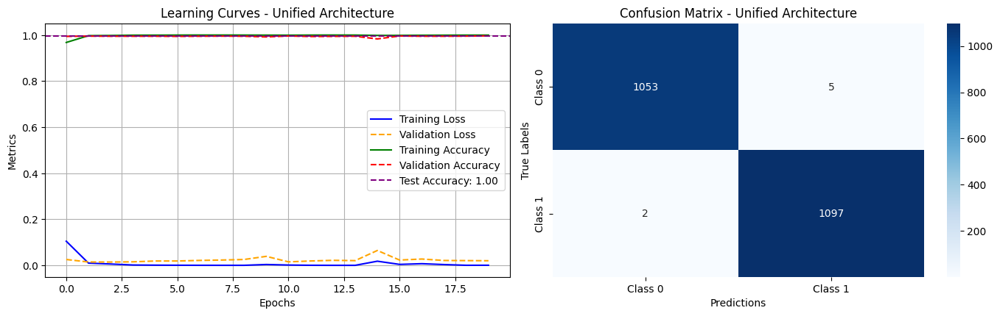

In [83]:
# Performance Metrics
accuracy = accuracy_score(y_test, y_pred)
print("Classification Report:\n", classification_report(y_test, y_pred))

# Compute the confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)

# Configure the figure
plt.figure(figsize=(14, 8))

# Combined curves: Accuracy and Loss
plt.subplot(2, 2, 1)

# Loss
plt.plot(history.history['loss'], label='Training Loss', color='blue')
plt.plot(history.history['val_loss'], label='Validation Loss', color='orange', linestyle='--')

# Accuracy
plt.plot(history.history['accuracy'], label='Training Accuracy', color='green')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy', color='red', linestyle='--')

# Test Accuracy
plt.axhline(y=accuracy, color='purple', linestyle='--', label=f'Test Accuracy: {accuracy:.2f}')

plt.title("Learning Curves - Unified Architecture")
plt.xlabel("Epochs")
plt.ylabel("Metrics")
plt.legend()
plt.grid(True)

# Confusion Matrix
plt.subplot(2, 2, 2)
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=["Class 0", "Class 1"], yticklabels=["Class 0", "Class 1"])
plt.title("Confusion Matrix - Unified Architecture")
plt.xlabel("Predictions")
plt.ylabel("True Labels")

# Adjust layout
plt.tight_layout()
plt.show()

*The interpretation of the results is available in the report.

## Multimodal model

In [84]:
from tensorflow.keras.preprocessing.sequence import pad_sequences

# Padding for text sequences
train_text_pad = pad_sequences(train_df['text_encoded'], maxlen=max_len_text_opti, padding='post')
val_text_pad = pad_sequences(val_df['text_encoded'], maxlen=max_len_text_opti, padding='post')
test_text_pad = pad_sequences(test_df['text_encoded'], maxlen=max_len_text_opti, padding='post')

# Padding for emojis sequences
train_emoji_pad = pad_sequences(train_df['emoji_indices'], maxlen=max_len_emoji_opti, padding='post')
val_emoji_pad = pad_sequences(val_df['emoji_indices'], maxlen=max_len_emoji_opti, padding='post')
test_emoji_pad = pad_sequences(test_df['emoji_indices'], maxlen=max_len_emoji_opti, padding='post')

# Labels
train_labels = train_df['label'].values
val_labels = val_df['label'].values
test_labels = test_df['label'].values

In [85]:
# Check shapes shapes
print(f"Train Text Shape: {train_text_pad.shape}, Train Emojis Shape: {train_emoji_pad.shape}")
print(f"Validation Text Shape: {val_text_pad.shape}, Validation Emojis Shape: {val_emoji_pad.shape}")
print(f"Test Text Shape: {test_text_pad.shape}, Test Emojis Shape: {test_emoji_pad.shape}\n")

print(f"train label shape: {train_labels.shape}")
print(f"val label shape: {val_labels.shape}")
print(f"test label shape: {test_labels.shape}")

Train Text Shape: (6900, 55), Train Emojis Shape: (6900, 9)
Validation Text Shape: (1726, 55), Validation Emojis Shape: (1726, 9)
Test Text Shape: (2157, 55), Test Emojis Shape: (2157, 9)

train label shape: (6900,)
val label shape: (1726,)
test label shape: (2157,)


Les Shape

In [ ]:
text_vocab_pad_oov = text_vocab_size + 1 # oov token is already in the vocabulaire + 1 for padding

In [ ]:
# Get last and first index of emoji vocabulary
first_index_emoji = min(emoji_vocab.values())
last_index_emoji = max(emoji_vocab.values())
print(f"Le premier index est : {first_index_emoji}")
print(f"Le dernier index est : {last_index_emoji}")

Le premier index est : 2000
Le dernier index est : 2355


In [ ]:
# Compute emoji vocabulary size
emoji_vocab_pad_oov = last_index_emoji - first_index_emoji + 1 + 2 # +1 including 2355 / +2 padding et OOV
emoji_vocab_pad_oov

358

In [89]:
len(emoji_vocab)

356

In [90]:
text_vocab_pad_oov

2000

In [ ]:
emoji_vocab

{'🌅': 2000,
 '🌈': 2001,
 '🌊': 2002,
 '🌌': 2003,
 '🌍': 2004,
 '🌎': 2005,
 '🌐': 2006,
 '🌞': 2007,
 '🌟': 2008,
 '🌪': 2009,
 '🌭': 2010,
 '🌮': 2011,
 '🌱': 2012,
 '🌴': 2013,
 '🌶': 2014,
 '🌷': 2015,
 '🌸': 2016,
 '🌺': 2017,
 '🌻': 2018,
 '🌼': 2019,
 '🌽': 2020,
 '🌿': 2021,
 '🍀': 2022,
 '🍂': 2023,
 '🍃': 2024,
 '🍅': 2025,
 '🍆': 2026,
 '🍇': 2027,
 '🍉': 2028,
 '🍊': 2029,
 '🍋': 2030,
 '🍌': 2031,
 '🍍': 2032,
 '🍎': 2033,
 '🍏': 2034,
 '🍐': 2035,
 '🍑': 2036,
 '🍒': 2037,
 '🍓': 2038,
 '🍔': 2039,
 '🍕': 2040,
 '🍖': 2041,
 '🍗': 2042,
 '🍛': 2043,
 '🍜': 2044,
 '🍝': 2045,
 '🍞': 2046,
 '🍟': 2047,
 '🍠': 2048,
 '🍦': 2049,
 '🍨': 2050,
 '🍩': 2051,
 '🍪': 2052,
 '🍰': 2053,
 '🍲': 2054,
 '🍳': 2055,
 '🍴': 2056,
 '🍵': 2057,
 '🍷': 2058,
 '🍹': 2059,
 '🍺': 2060,
 '🍻': 2061,
 '🍽': 2062,
 '🍾': 2063,
 '🍿': 2064,
 '🎀': 2065,
 '🎁': 2066,
 '🎃': 2067,
 '🎈': 2068,
 '🎉': 2069,
 '🎊': 2070,
 '🎓': 2071,
 '🎞': 2072,
 '🎟': 2073,
 '🎤': 2074,
 '🎥': 2075,
 '🎧': 2076,
 '🎨': 2077,
 '🎬': 2078,
 '🎮': 2079,
 '🎯': 2080,
 '🎵': 2081,
 '🏃': 2082,
 '🏆'

In [115]:
# Print examples of re-indexed sequences from the train, validation, and test sets
print("Example of sequence (train):", train_emoji_pad[10:40])
print("Example of sequence (validation):", val_emoji_pad[10:40])
print("Example of sequence (test):", test_emoji_pad[10:40])

# Check if padding (0) is present in the sequences
print("Padding present:", any(0 in seq for seq in train_emoji_pad))

Example of sequence (train): [[   0    0    0    0    0    0    0    0    0]
 [   0    0    0    0    0    0    0    0    0]
 [   0    0    0    0    0    0    0    0    0]
 [   0    0    0    0    0    0    0    0    0]
 [   0    0    0    0    0    0    0    0    0]
 [   0    0    0    0    0    0    0    0    0]
 [   0    0    0    0    0    0    0    0    0]
 [   0    0    0    0    0    0    0    0    0]
 [   0    0    0    0    0    0    0    0    0]
 [   0    0    0    0    0    0    0    0    0]
 [   0    0    0    0    0    0    0    0    0]
 [   0    0    0    0    0    0    0    0    0]
 [   0    0    0    0    0    0    0    0    0]
 [   0    0    0    0    0    0    0    0    0]
 [   0    0    0    0    0    0    0    0    0]
 [   0    0    0    0    0    0    0    0    0]
 [   0    0    0    0    0    0    0    0    0]
 [   0    0    0    0    0    0    0    0    0]
 [   0    0    0    0    0    0    0    0    0]
 [2178 2178 2178    0    0    0    0    0    0]
 [   0    0

The inclusion of a Lambda layer in the multimodal models was implemented to avoid confusion between the vocabulary indices of the text input and the emoji input. This modification addresses a technical issue related to the Embedding layer, which does not allow the use of indices higher than the size of its vocabulary (input_dim: 358). Emoji indices, which ranged from 2000 to 2355 in the unified model, are now mapped to the range 0–358 (including padding and OOV) without the risk of overlapping with the encoded text indices, which range from 0 to 1999 (including padding and OOV).

In [ ]:
from tensorflow.keras.layers import Input, Embedding, LSTM, Dense, Dropout, Bidirectional, Concatenate, Lambda
from tensorflow.keras.models import Model
import tensorflow as tf

# Paramètres
embedding_dim_text = 128
embedding_dim_emoji = 64
lstm_units = 64
dense_units = 64
emoji_offset = 2000  # "Initial offset of emoji indices to avoid overlap between emoji and text vocabulary indices

def reindex_emojis(x):
    # Convert to int32
    x = tf.cast(x, tf.int32)
    # if indice 0 (padding), we keep it, else we apply reindexing
    x = tf.where(x == 0, 0, x - emoji_offset)
    return x

# Input 1: Text Encoded
input_text = Input(shape=(max_len_text_opti,), name="input_text")  # Input layer for text sequences
embedding_text = Embedding(input_dim=text_vocab_pad_oov, output_dim=embedding_dim_text, mask_zero=True)(input_text)  # Embedding pour le texte
lstm_text = Bidirectional(LSTM(lstm_units, return_sequences=False))(embedding_text)  # BiLSTM for text sequences

# Input 2: Emoji Indices
input_emojis = Input(shape=(max_len_emoji_opti,), name="input_emojis")  # Input layer for emojis sequences
emoji_indices_checked = Lambda(
    reindex_emojis, 
    output_shape=lambda input_shape: input_shape  # "The output shape is identical to the input shape."
)(input_emojis)  # Output layer with sigmoid activation for binary classification

embedding_emojis = Embedding(input_dim=emoji_vocab_pad_oov, output_dim=embedding_dim_emoji, mask_zero=True)(emoji_indices_checked)  # Embedding pour les emojis
lstm_emojis = Bidirectional(LSTM(lstm_units, return_sequences=False, dropout=0.3))(embedding_emojis)  # BiLSTM for emohji sequences

# Merging modalities
merged = Concatenate()([lstm_text, lstm_emojis])  # Merged BILSTM outputs

# Dense Layers after merged
dense_merged = Dense(dense_units, activation='relu')(merged)  # Dense layer with ReLU activation
dropout_merged = Dropout(0.5)(dense_merged)  # Dropout for regularization

# Output Layer
output_layer = Dense(1, activation='sigmoid', name="output")(dropout_merged)  # Couche de sortie avec activation sigmoïde pour la classification binaire

# Final multimodal model
model_multimodal = Model(inputs=[input_text, input_emojis], outputs=output_layer)

# Model summary
model_multimodal.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_emojis        │ (None, 9)         │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ input_text          │ (None, 55)        │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lambda (Lambda)     │ (None, 9)         │          0 │ input_emojis[0][… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ embedding_1         │ (None, 55, 128)   │    256,000 │ input_text[0][0]  │
│ (Embedding)         │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ not_equal_1         │ (None, 55)        │          0 │ input_text[0][0]  │
│ (NotEqual)          │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ embedding_2         │ (None, 9, 64)     │     22,912 │ lambda[0][0]      │
│ (Embedding)         │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ not_equal_2         │ (None, 9)         │          0 │ lambda[0][0]      │
│ (NotEqual)          │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bidirectional_1     │ (None, 128)       │     98,816 │ embedding_1[0][0… │
│ (Bidirectional)     │                   │            │ not_equal_1[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bidirectional_2     │ (None, 128)       │     66,048 │ embedding_2[0][0… │
│ (Bidirectional)     │                   │            │ not_equal_2[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate         │ (None, 256)       │          0 │ bidirectional_1[… │
│ (Concatenate)       │                   │            │ bidirectional_2[… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_1 (Dense)     │ (None, 64)        │     16,448 │ concatenate[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_1 (Dropout) │ (None, 64)        │          0 │ dense_1[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ output (Dense)      │ (None, 1)         │         65 │ dropout_1[0][0]   │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 460,289 (1.76 MB)

 Trainable params: 460,289 (1.76 MB)

 Non-trainable params: 0 (0.00 B)

In [95]:
optimizer = tf.keras.optimizers.Adam()

model_multimodal.compile(
    optimizer=optimizer,
    loss=tf.keras.losses.BinaryCrossentropy(),
    metrics=[
        tf.keras.metrics.BinaryAccuracy(name="accuracy"),  
        tf.keras.metrics.FalseNegatives(name="false_negatives"),
        tf.keras.metrics.TrueNegatives(name="true_negatives"),
        tf.keras.metrics.FalsePositives(name="false_positives"),
        tf.keras.metrics.TruePositives(name="true_positives")
    ]
)

In [96]:
import tensorflow as tf
# Create tensorflow datasets
train_ds = tf.data.Dataset.from_tensor_slices(
    ((train_text_pad, train_emoji_pad), train_labels)  # Inputs et labels
).batch(32).shuffle(len(train_text_pad))

val_ds = tf.data.Dataset.from_tensor_slices(
    ((val_text_pad, val_emoji_pad), val_labels)
).batch(32)

test_ds = tf.data.Dataset.from_tensor_slices(
    ((test_text_pad, test_emoji_pad), test_labels)
).batch(32)

In [97]:
# Check the shapes of the data in train_ds
for (text_batch, emoji_batch), label_batch in train_ds.take(1):
    print(f"Text batch shape: {text_batch.shape}")  # (batch_size, max_len_text_opti)
    print(f"Emoji batch shape: {emoji_batch.shape}")  # (batch_size, max_len_emoji_opti)
    print(f"Label batch shape: {label_batch.shape}")  # (batch_size,)

Text batch shape: (32, 55)
Emoji batch shape: (32, 9)
Label batch shape: (32,)


In [98]:
max_emoji_index = max([max(seq) for seq in train_emoji_pad if len(seq) > 0])
print(f"Max emoji index in train data: {max_emoji_index}")

max_emoji_index_val = max([max(seq) for seq in val_emoji_pad if len(seq) > 0])
print(f"Max emoji index in validation data: {max_emoji_index_val}")

max_emoji_index_test = max([max(seq) for seq in test_emoji_pad if len(seq) > 0])
print(f"Max emoji index in test data: {max_emoji_index_test}")


Max emoji index in train data: 2355
Max emoji index in validation data: 2351
Max emoji index in test data: 2352


In [ ]:
# Train the model
history = model_multimodal.fit(
    train_ds,                # Training dataset
    validation_data=val_ds,  # Validation dataset
    epochs= 10               # Number of epochs
)

# Evaluate the model on the test dataset
results = model_multimodal.evaluate(test_ds)

# Display the results
print(f"Test set loss: {results[0]:.4f}")  # The first value represents the loss
print(f"Test set accuracy: {results[1]:.4f}")  # The second value represents the accuracy

Epoch 1/10
216/216 ━━━━━━━━━━━━━━━━━━━━ 18s 44ms/step - accuracy: 0.9116 - false_negatives: 125.1521 - false_positives: 53.2857 - loss: 0.2696 - true_negatives: 1657.1152 - true_positives: 1644.1152 - val_accuracy: 0.9936 - val_false_negatives: 3.0000 - val_false_positives: 8.0000 - val_loss: 0.0194 - val_true_negatives: 839.0000 - val_true_positives: 876.0000
Epoch 2/10
216/216 ━━━━━━━━━━━━━━━━━━━━ 9s 41ms/step - accuracy: 0.9973 - false_negatives: 2.9124 - false_positives: 5.8756 - loss: 0.0100 - true_negatives: 1715.6682 - true_positives: 1759.0830 - val_accuracy: 0.9942 - val_false_negatives: 2.0000 - val_false_positives: 8.0000 - val_loss: 0.0243 - val_true_negatives: 839.0000 - val_true_positives: 877.0000
Epoch 3/10
216/216 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - accuracy: 0.9983 - false_negatives: 0.9585 - false_positives: 5.1889 - loss: 0.0052 - true_negatives: 1699.6589 - true_positives: 1778.3964 - val_accuracy: 0.9954 - val_false_negatives: 3.0000 - val_false_positives: 5.0000 

In [ ]:
# Predictions on test set
y_pred_classes = model_multimodal.predict(test_ds)  
y_pred = (y_pred_classes > 0.5).astype(int).flatten() 

y_test = np.concatenate([labels.numpy() for _, labels in test_ds])

test_accuracy = accuracy_score(y_test, y_pred)


# Retrieve True labels
y_true = []
for _, y_batch in test_ds:
    y_true.extend(y_batch.numpy()) 

y_true = np.array(y_true)

68/68 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step


Classification Report:
               precision    recall  f1-score   support

           0       0.99      0.99      0.99      1058
           1       0.99      0.99      0.99      1099

    accuracy                           0.99      2157
   macro avg       0.99      0.99      0.99      2157
weighted avg       0.99      0.99      0.99      2157



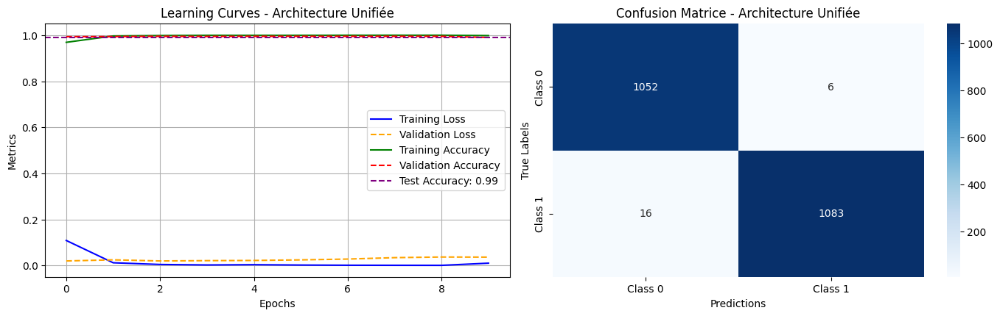

In [ ]:
# Metrics performances
accuracy = accuracy_score(y_test, y_pred)
print("Classification Report:\n", classification_report(y_test, y_pred))

# Confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)

# figure configuration
plt.figure(figsize=(14, 8))

# Combined curves : Accuracy et Loss
plt.subplot(2, 2, 1)

# Loss
plt.plot(history.history['loss'], label='Training Loss', color='blue')
plt.plot(history.history['val_loss'], label='Validation Loss', color='orange', linestyle='--')

# Accuracy
plt.plot(history.history['accuracy'], label='Training Accuracy', color='green')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy', color='red', linestyle='--')

plt.axhline(y=accuracy, color='purple', linestyle='--', label=f'Test Accuracy: {accuracy:.2f}')

plt.title("Learning Curves - Architecture Unifiée")
plt.xlabel("Epochs")
plt.ylabel("Metrics")
plt.legend()
plt.grid(True)

# Confusion Matrix
plt.subplot(2, 2, 2)
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=["Class 0", "Class 1"], yticklabels=["Class 0", "Class 1"])
plt.title("Confusion Matrice - Architecture Unifiée")
plt.xlabel("Predictions")
plt.ylabel("True Labels")

# Figure layout
plt.tight_layout()
plt.show()

*The interpretation of the results is available in the report

## Random Search : multimodal model

In [ ]:
from keras_tuner import RandomSearch
from tensorflow.keras.layers import Input, Embedding, LSTM, Dense, Dropout, Bidirectional, Concatenate, Lambda
from tensorflow.keras.models import Model
import tensorflow as tf
from keras_tuner import HyperModel

# Paramètres globaux
emoji_offset = 2000  # Décalage initial des indices emojis dans vos données

# Fonction pour gérer les indices emojis (avec exclusion du padding)
def reindex_emojis(x):
    # Convert to int32
    x = tf.cast(x, tf.int32)
    # if indice is 0 (padding), we keep it, else, apply offset (2000)
    x = tf.where(x == 0, 0, x - emoji_offset)
    return x

# Function to build the model with dynamic hyperparameters
def build_multimodal_model(hp):
    
    # Hyperparameters
    embedding_dim_text = hp.Choice('embedding_dim_text', [64, 128, 256])  # Embedding size for text
    embedding_dim_emoji = hp.Choice('embedding_dim_emoji', [32, 64, 128])  # Embedding size for emojis
    lstm_units = hp.Int('lstm_units', min_value=32, max_value=128, step=32)  # LSTM units
    dense_units = hp.Choice('dense_units', [32, 64, 128])  # Dense layer units
    dropout_rate = hp.Float('dropout_rate', min_value=0.2, max_value=0.5, step=0.1)  # Dropout rate
    learning_rate = hp.Float('learning_rate', min_value=0.0001, max_value=0.01, sampling='LOG')  # Learning rate

    # Text input branch
    input_text = Input(shape=(max_len_text_opti,), name="input_text")  # Input layer for text
    embedding_text = Embedding(input_dim=text_vocab_pad_oov, output_dim=embedding_dim_text, mask_zero=True)(input_text)  # Embedding layer for text
    lstm_text = Bidirectional(LSTM(lstm_units, return_sequences=False))(embedding_text)  # BiLSTM for text sequences

    # Emoji input branch
    input_emojis = Input(shape=(max_len_emoji_opti,), name="input_emojis")  # Input layer for emojis
    emoji_indices_checked = Lambda(reindex_emojis, output_shape=lambda input_shape: input_shape)(input_emojis)  # Gestion des indices emojis
    embedding_emojis = Embedding(input_dim= emoji_vocab_pad_oov, output_dim=embedding_dim_emoji, mask_zero=True)(emoji_indices_checked)  # Embedding layer for emojis
    lstm_emojis = Bidirectional(LSTM(lstm_units, return_sequences=False))(embedding_emojis)  # BiLSTM for emoji sequences

    # Merge branches
    merged = Concatenate()([lstm_text, lstm_emojis])  # Concatenate text and emoji outputs

    # Dense layers
    dense_merged = Dense(dense_units, activation='relu')(merged)  # Dense layer with ReLU activation
    dropout_merged = Dropout(dropout_rate)(dense_merged)  # Dropout layer for regularization
    output_layer = Dense(1, activation='sigmoid', name="output")(dropout_merged)  # Sigmoid output for binary classification

    # Create and compile the model
    model = Model(inputs=[input_text, input_emojis], outputs=output_layer)

    optimizer = tf.keras.optimizers.Adam(learning_rate=learning_rate)  # Adam optimizer with tunable learning rate

    model.compile(
        optimizer=optimizer,
        loss=tf.keras.losses.BinaryCrossentropy(),  # Binary crossentropy loss function
        metrics=[
            tf.keras.metrics.BinaryAccuracy(name="accuracy"),
            tf.keras.metrics.FalseNegatives(name="false_negatives"),  
            tf.keras.metrics.TrueNegatives(name="true_negatives"), 
            tf.keras.metrics.FalsePositives(name="false_positives"),  
            tf.keras.metrics.TruePositives(name="true_positives") 
        ]
    )
    return model_multimodal

keras need numpy array

In [103]:
train_emoji_pad = np.array(train_emoji_pad)
val_emoji_pad = np.array(val_emoji_pad)
test_emoji_pad = np.array(test_emoji_pad)

In [104]:
# Check shapes
print(f"Train text shape: {train_text_pad.shape}")
print(f"Train emoji shape: {train_emoji_pad.shape}")
print(f"Train labels shape: {train_labels.shape}")


Train text shape: (6900, 55)
Train emoji shape: (6900, 9)
Train labels shape: (6900,)


In [105]:
from keras_tuner import RandomSearch

# Create the RandomSearch instance
tuner = RandomSearch(
    build_multimodal_model,  # The model to optimize
    objective='val_accuracy',  # The objective to maximize during the search
    max_trials=15,  # Number of trials to perform in the random search
    executions_per_trial=1,  # Number of executions for each configuration
    directory='my_tuner_dir',  # Directory to save the search results
    project_name='multimodal_tuning',  # Project name for organizing the results
    seed=42  # Random seed for reproducibility
)

Reloading Tuner from my_tuner_dir\multimodal_tuning\tuner0.json


In [106]:
tuner.search(
    [train_text_pad, train_emoji_pad],  # inputs model
    train_labels,  # Labels
    validation_data=([val_text_pad, val_emoji_pad], val_labels),
    epochs=10,
    batch_size=32
)

In [107]:
# Retrieve the best hyperparameters
best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]

# Display the optimized hyperparameters
print("Best hyperparameters found:")
print(f" - Embedding size for text: {best_hps.get('embedding_dim_text')}")
print(f" - Embedding size for emojis: {best_hps.get('embedding_dim_emoji')}")
print(f" - Number of LSTM units: {best_hps.get('lstm_units')}")
print(f" - Number of units in the Dense layer: {best_hps.get('dense_units')}")
print(f" - Dropout rate: {best_hps.get('dropout_rate')}")
print(f" - Learning rate: {best_hps.get('learning_rate')}")

Best hyperparameters found:
 - Embedding size for text: 256
 - Embedding size for emojis: 64
 - Number of LSTM units: 128
 - Number of units in the Dense layer: 64
 - Dropout rate: 0.30000000000000004
 - Learning rate: 0.001501208196671069


In [108]:
# Build model with best parameters found by random search
best_model_rs = tuner.hypermodel.build(best_hps)

In [109]:
best_model_rs.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_emojis        │ (None, 9)         │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ input_text          │ (None, 55)        │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lambda (Lambda)     │ (None, 9)         │          0 │ input_emojis[0][… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ embedding_1         │ (None, 55, 128)   │    256,000 │ input_text[0][0]  │
│ (Embedding)         │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ not_equal_1         │ (None, 55)        │          0 │ input_text[0][0]  │
│ (NotEqual)          │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ embedding_2         │ (None, 9, 64)     │     22,912 │ lambda[0][0]      │
│ (Embedding)         │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ not_equal_2         │ (None, 9)         │          0 │ lambda[0][0]      │
│ (NotEqual)          │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bidirectional_1     │ (None, 128)       │     98,816 │ embedding_1[0][0… │
│ (Bidirectional)     │                   │            │ not_equal_1[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bidirectional_2     │ (None, 128)       │     66,048 │ embedding_2[0][0… │
│ (Bidirectional)     │                   │            │ not_equal_2[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate         │ (None, 256)       │          0 │ bidirectional_1[… │
│ (Concatenate)       │                   │            │ bidirectional_2[… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_1 (Dense)     │ (None, 64)        │     16,448 │ concatenate[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_1 (Dropout) │ (None, 64)        │          0 │ dense_1[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ output (Dense)      │ (None, 1)         │         65 │ dropout_1[0][0]   │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 1,380,869 (5.27 MB)

 Trainable params: 460,289 (1.76 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 920,580 (3.51 MB)

In [ ]:
# Model training
history = best_model_rs.fit(
    train_ds,               
    validation_data=val_ds, 
    epochs=10
)

# Evaluate model on test set
results = best_model_rs.evaluate(test_ds)

# Display results
print(f"Loss sur le test set : {results[0]:.4f}") 
print(f"Accuracy sur le test set : {results[1]:.4f}") 

Epoch 1/10
216/216 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - accuracy: 0.9964 - false_negatives: 5.9631 - false_positives: 3.5899 - loss: 0.0138 - true_negatives: 1703.3042 - true_positives: 1774.1106 - val_accuracy: 0.9942 - val_false_negatives: 4.0000 - val_false_positives: 6.0000 - val_loss: 0.0245 - val_true_negatives: 841.0000 - val_true_positives: 875.0000
Epoch 2/10
216/216 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - accuracy: 0.9999 - false_negatives: 0.5668 - false_positives: 0.0000e+00 - loss: 9.3034e-04 - true_negatives: 1709.9447 - true_positives: 1774.4102 - val_accuracy: 0.9959 - val_false_negatives: 3.0000 - val_false_positives: 4.0000 - val_loss: 0.0213 - val_true_negatives: 843.0000 - val_true_positives: 876.0000
Epoch 3/10
216/216 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - accuracy: 1.0000 - false_negatives: 0.0000e+00 - false_positives: 0.0000e+00 - loss: 2.7726e-04 - true_negatives: 1691.2858 - true_positives: 1795.2396 - val_accuracy: 0.9954 - val_false_negatives: 4.0000 - val_false_po

In [ ]:
# Predictions on test set
y_pred_probs = best_model_rs.predict(test_ds)

# Convert probabilities to binary predictions (threshold = 0.5)
y_pred = (y_pred_probs > 0.5).astype(int).flatten()

# Retrieve True labels from test_ds
y_true = []
for _, labels in test_ds:
    y_true.extend(labels.numpy())

y_true = np.array(y_true)

# Confusion Matrix
conf_matrix = confusion_matrix(y_true, y_pred)

 1/68 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step

68/68 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step


<Axes: >

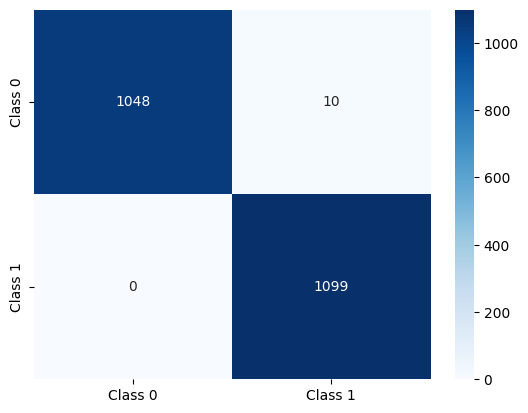

In [112]:
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=["Class 0", "Class 1"], yticklabels=["Class 0", "Class 1"])

In [ ]:
# Metrics test set performance
test_accuracy = accuracy_score(y_test, y_pred)
test_accuracy

0.9953639313861845

Classification Report:
               precision    recall  f1-score   support

           0       1.00      0.99      1.00      1058
           1       0.99      1.00      1.00      1099

    accuracy                           1.00      2157
   macro avg       1.00      1.00      1.00      2157
weighted avg       1.00      1.00      1.00      2157



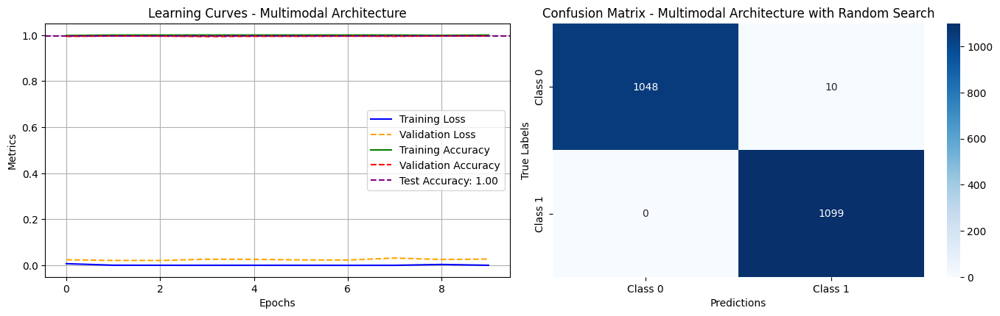

In [114]:
# Performance metrics
test_accuracy = accuracy_score(y_test, y_pred)
print("Classification Report:\n", classification_report(y_test, y_pred))

# Configure the figure
plt.figure(figsize=(14, 8))

# Combined Curves: Accuracy and Loss
plt.subplot(2, 2, 1)

# Loss
plt.plot(history.history['loss'], label='Training Loss', color='blue')
plt.plot(history.history['val_loss'], label='Validation Loss', color='orange', linestyle='--')

# Accuracy
plt.plot(history.history['accuracy'], label='Training Accuracy', color='green')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy', color='red', linestyle='--')

plt.axhline(y=test_accuracy, color='purple', linestyle='--', label=f'Test Accuracy: {test_accuracy:.2f}')

plt.title("Learning Curves - Multimodal Architecture")
plt.xlabel("Epochs")
plt.ylabel("Metrics")
plt.legend()
plt.grid(True)

# Confusion Matrix
plt.subplot(2, 2, 2)
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=["Class 0", "Class 1"], yticklabels=["Class 0", "Class 1"])
plt.title("Confusion Matrix - Multimodal Architecture with Random Search")
plt.xlabel("Predictions")
plt.ylabel("True Labels")

# Adjust layout
plt.tight_layout()
plt.show()

*The interpretation of the results is available in the report.